## Test: Align narrowband images to a baseline image using OpenCV

https://learnopencv.com/image-alignment-ecc-in-opencv-c-python/ 

In [1]:
### File Definitions: HERE YOU NEED TO SPECIFY WHICH FILES / FOLDERS YOU WANT TO USE
import os
# Source to download / get the RAW files from
urlpath = 'https://stars.uchicago.edu/images/StoneEdge/0.5meter/2021/2021-02-16/itzamna/'
filenames = ['NGC2403_clear_30s_bin1_210216_060730_itzamna_seo_0_RAW.fits',
             'NGC2403_h-alpha_120s_bin2_210216_062520_itzamna_seo_0_RAW.fits']
# Location where you want the logfile
logfilename = '/content/pipelog.txt'
# Location where the code is
codefolder = '/content'
# Location where you want the data to be
datafolder = '/content/data'
# Location of config files
baseconfig = os.path.join(codefolder,'pipeline/config','pipeconf_SEO.txt')

In [2]:
### Setting up
# Import statements
import sys
import urllib.request
import logging
import requests
# Set up the logging
logging.basicConfig(filename = logfilename,level = logging.DEBUG,
                    format = "%(asctime)s - %(name)s - %(levelname)s - %(message)s")

In [3]:
### Install Packages
! pip install configobj
! pip install ccdproc
! pip install lmfit
! pip install darepype
! pip install astroquery
# If you run this on your computer, make sure you have DarePype V0.1.3 or later
print('Packages installed')

Packages installed


In [4]:
### Install SEO pipeline - and go to correct branch
# Clone the project from github
os.chdir(codefolder)
!git clone https://github.com/yerkesobservatory/pipeline.git
# If you want to checkout a different branch
#os.chdir('pipeline')
#!git checkout darepype
# Set the Path
sys.path.append(os.path.join(codefolder,'pipeline/source'))
print('Instaled SEO pipeline')

fatal: destination path 'pipeline' already exists and is not an empty directory.
Instaled SEO pipeline


In [5]:
### Load the images from the web.
#   WARNING: If you get ANY error messages here, please check your URLS and try again.
# Make the data folder if it doesn't exist
if not os.path.exists(datafolder):
    os.mkdir(datafolder)
fileurls = [os.path.join(urlpath,f) for f in filenames]
infilenames = [os.path.join(datafolder,f) for f in filenames]
for ind in range(len(filenames)):
    #filedata = urllib.urlretrieve(fileurls[ind],infilenames[ind]) # python 2
    #filedata = urllib.request.urlretrieve(fileurls[ind],infilenames[ind]) # python 3
    resp = requests.get(fileurls[ind],verify=False)
    open(infilenames[ind],'wb').write(resp.content)
print("Loaded files:\n%s" % '\n'.join(filenames))

/usr/local/lib/python3.6/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)
/usr/local/lib/python3.6/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)


Loaded files:
NGC2403_clear_30s_bin1_210216_060730_itzamna_seo_0_RAW.fits
NGC2403_h-alpha_120s_bin2_210216_062520_itzamna_seo_0_RAW.fits


In [6]:
from darepype.drp import DataParent
dparent = DataParent(config = baseconfig)
dfits = dparent.load(infilenames[0])
print(dfits.filename)

/content/data/NGC2403_clear_30s_bin1_210216_060730_itzamna_seo_0_RAW.fits


In [7]:
import sys
import numpy as np
try:
    from astropy.io import fits
    from astropy.table import Table as tbl
except ImportError:
    import pyfits as fits
from PIL import Image

# Try to read data from first HDU in fits file
data1 = fits.open(infilenames[0])[0].data
# If nothing is there try the second one
if data1 is None:
    data1 = fits.open(infilenames[0])[1].data

# Scale data to range [0, 1] 
# Convert to 8-bit integer  
data1 = (255*data1).astype(np.uint8)
# Invert y axis
data1 = data1[::-1, :]

# Create image from data array and save as jpg
image = Image.fromarray(data1, 'L')
imagename1 = infilenames[0].replace('.fits', '.jpg')
print(imagename1)
image.save(imagename1)

# Try to read data from first HDU in fits file
data2 = fits.open(infilenames[1])[0].data
# If nothing is there try the second one
if data2 is None:
    data2 = fits.open(infilenames[1])[1].data

# Scale data to range [0, 1] 
# Convert to 8-bit integer  
data2 = (data2).astype(np.uint8)
# Invert y axis
data2 = data2[::-1, :]

# Create image from data array and save as jpg
image = Image.fromarray(data2, 'L')
imagename2 = infilenames[1].replace('.fits', '.jpg')
print(imagename2)
image.save(imagename2)

/content/data/NGC2403_clear_30s_bin1_210216_060730_itzamna_seo_0_RAW.jpg
/content/data/NGC2403_h-alpha_120s_bin2_210216_062520_itzamna_seo_0_RAW.jpg


In [11]:
### cv2 test
import cv2
from google.colab.patches import cv2_imshow

# read image files
im1 = cv2.imread(imagename1)
im2 = cv2.imread(imagename2)

# Convert images to grayscale
im1_gray = cv2.cvtColor(im1,cv2.COLOR_BGR2GRAY)
im2_gray = cv2.cvtColor(im2,cv2.COLOR_BGR2GRAY)

# Find size of image1
sz = im1.shape

# Define the motion model
warp_mode = cv2.MOTION_TRANSLATION
 
# Define 2x3 or 3x3 matrices and initialize the matrix to identity
if warp_mode == cv2.MOTION_HOMOGRAPHY :
    warp_matrix = np.eye(3, 3, dtype=np.float32)
else :
    warp_matrix = np.eye(2, 3, dtype=np.float32)
 
# Specify the number of iterations.
number_of_iterations = 5000;
 
# Specify the threshold of the increment
# in the correlation coefficient between two iterations
termination_eps = 1e-10;
 
# Define termination criteria
criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, number_of_iterations,  termination_eps)
 
# Run the ECC algorithm. The results are stored in warp_matrix.
(cc, warp_matrix) = cv2.findTransformECC (im1_gray,im2_gray,warp_matrix, warp_mode, criteria, None, 1)
 
if warp_mode == cv2.MOTION_HOMOGRAPHY :
    # Use warpPerspective for Homography
    im2_aligned = cv2.warpPerspective (im2, warp_matrix, (sz[1],sz[0]), flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP)
else :
    # Use warpAffine for Translation, Euclidean and Affine
    im2_aligned = cv2.warpAffine(im2, warp_matrix, (sz[1],sz[0]), flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP);

print("Done.")

Done.


Clear image:


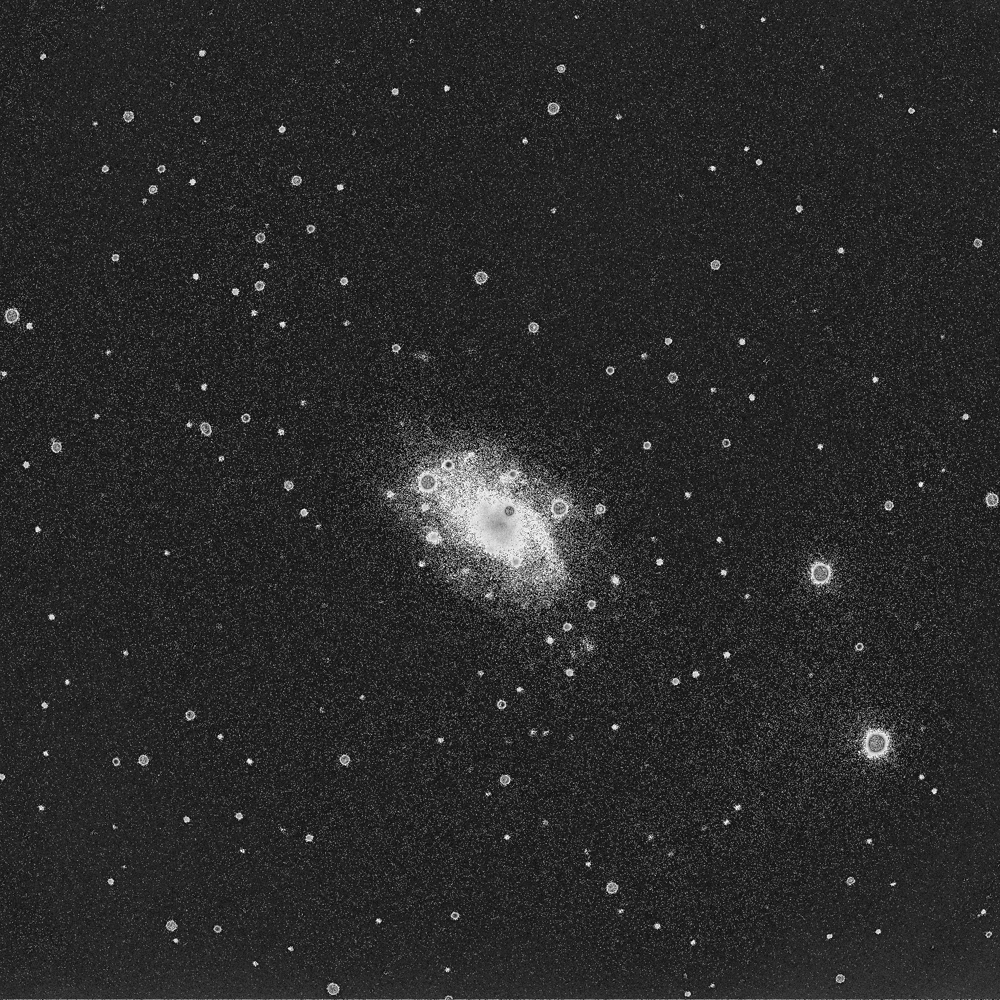

In [12]:
print("Clear image:")
cv2_imshow(im1)

Narrowband image:


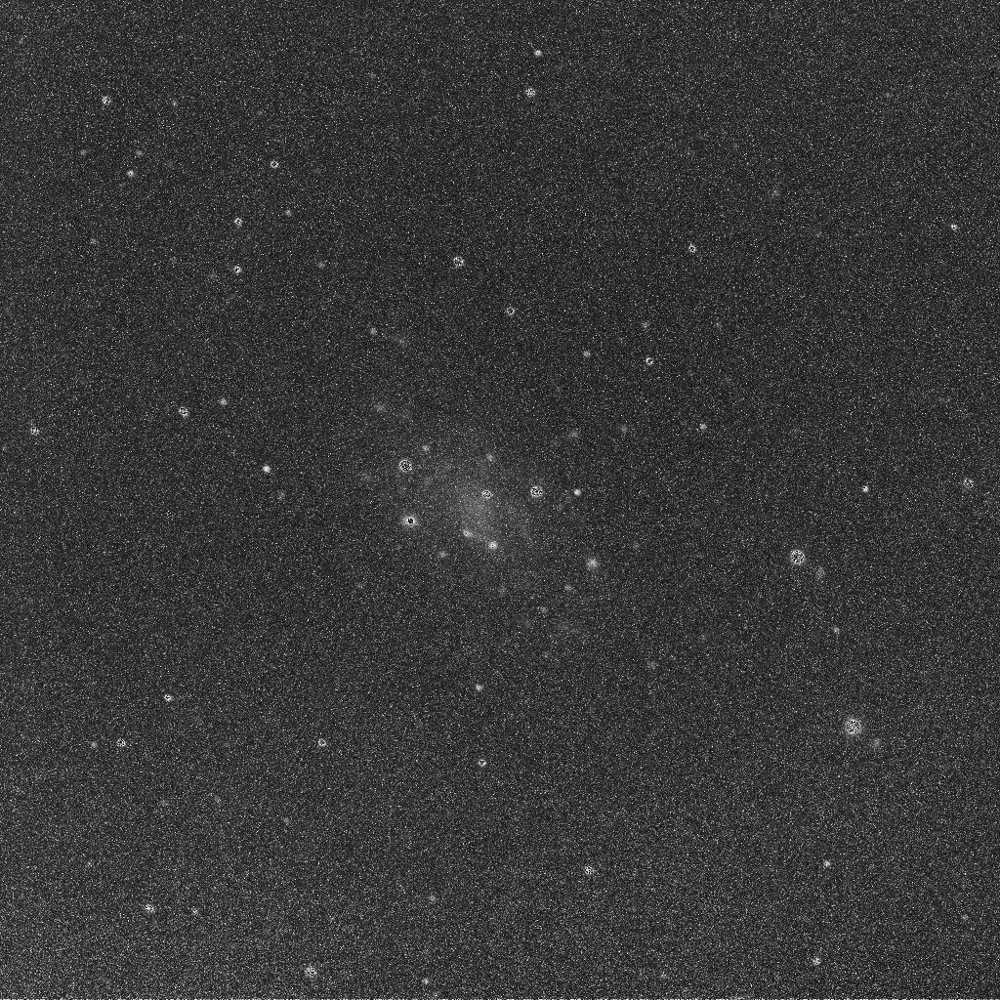

In [13]:
print("Narrowband image:")
cv2_imshow(im2)

Aligned narrowband image:


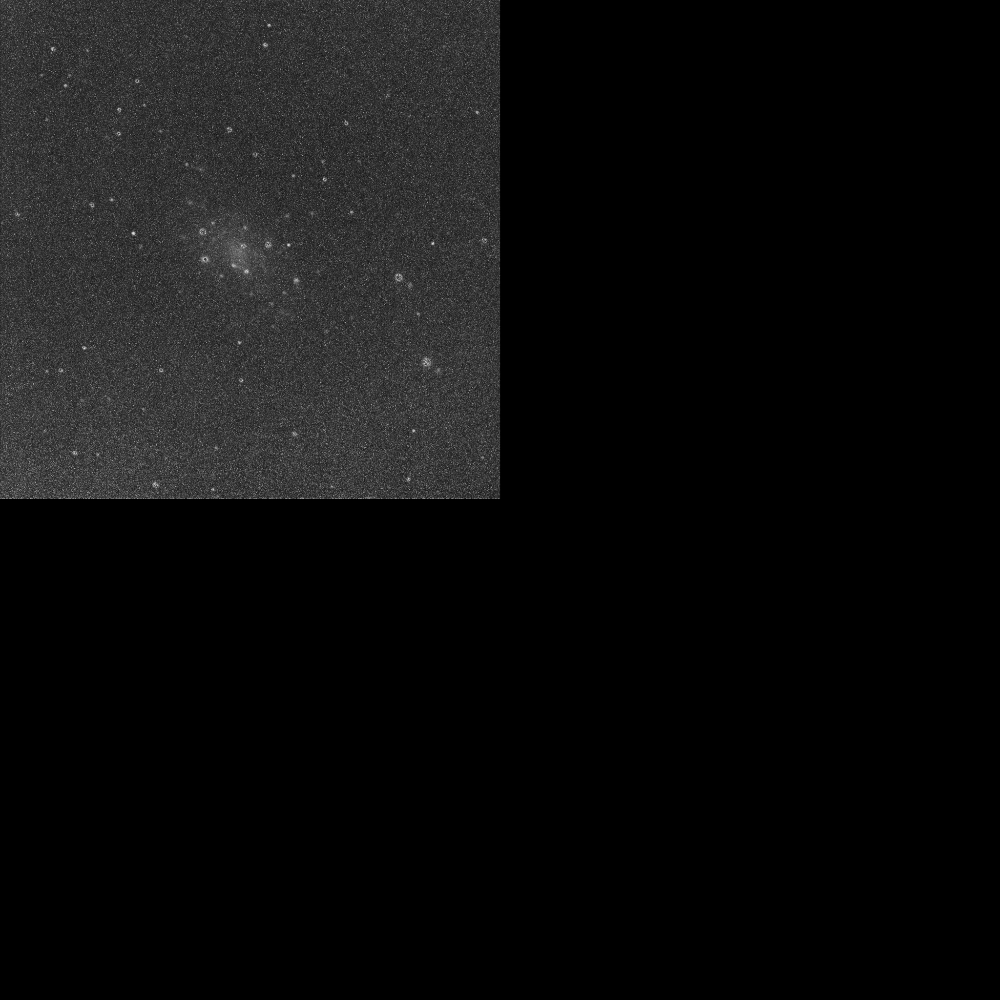

In [14]:
print("Aligned narrowband image:")
cv2_imshow(im2_aligned)